<a href="https://colab.research.google.com/github/klaasmeinke/CNNs-exoplanet-cartography/blob/main/NN_Albedos_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
%cd '/content/drive/MyDrive/Thesis'

%run Create_Data.ipynb

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import *
from tensorflow.keras import backend as K

keras.backend.set_floatx('float32')
print("num GPUs Avilable: ", len(tf.config.experimental.list_physical_devices('GPU')))

Mounted at /content/drive
/content/drive/MyDrive/Thesis
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Thesis
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Thesis
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Thesis
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/Thesis
num GPUs Avilable:  1


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Curve Convolutions

In [ ]:
def conv_curves(x, kernel_size = 1, filters = 1, activation = None, stride = 1,
                use_bias = True):
    idx = tf.constant(list(range(8)) + list(range(kernel_size - 1)))

    x = Lambda(lambda x: tf.gather(x, idx, axis = 2))(x)
    x = Conv2D(filters = filters, kernel_size = (1, kernel_size),
               padding = 'valid', activation = activation,
               strides = (1,stride), use_bias = use_bias)(x)

    return x

# Plot Earth's Albedo

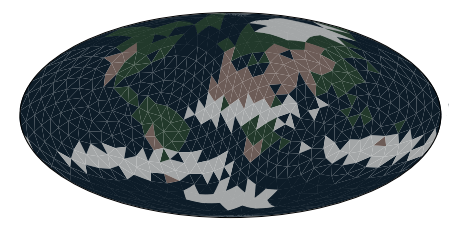

800 nm


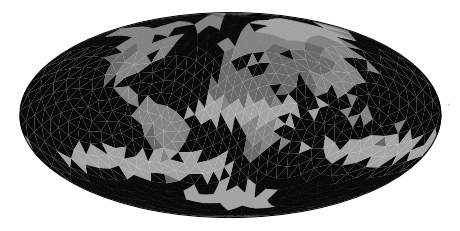

700 nm


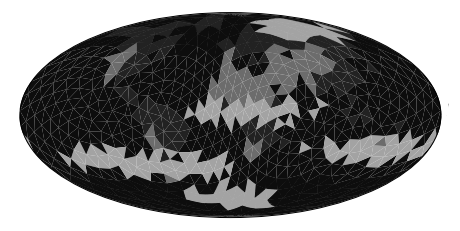

600 nm


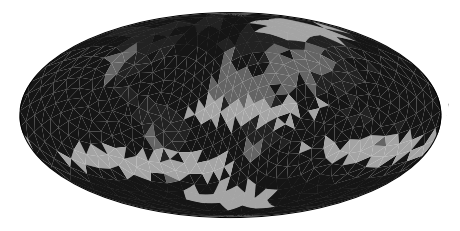

550 nm


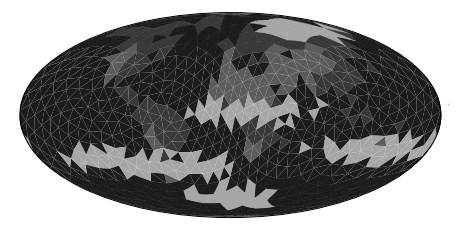

500 nm


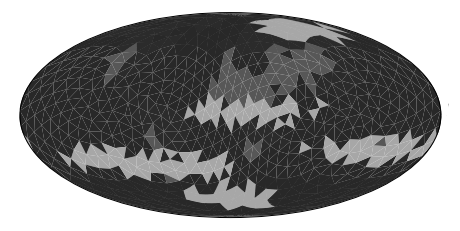

400 nm


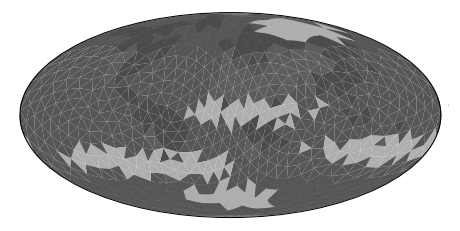

In [ ]:
earth_stypes = np.load('data/earth_surface_types.npy')
clouds = np.load('data/clouds.npy')
earth_stypes = combine(earth_stypes, clouds[21])
earth_wl = albedos[earth_stypes]

# PLOT
mollweide(faces, earth_stypes)
plt.show()
for i, wl in enumerate([800,700,600,550,500,400]):
    print(str(wl) + ' nm')
    mollweide(faces, earth_wl[:,i])
    plt.show()

# Test Different Wavelengths

In [ ]:
model = keras.Sequential()
model.add(Dense(stypes.shape[1], use_bias = False, input_shape = (64,)))
model.compile(optimizer = 'adam', loss='mse')
model.summary()

for i, wl in enumerate([800,700,600,550,500,400]):

    print()
    print()
    print(str(wl) + ' nm')

    model.fit(
        curves[:,:,:,1].reshape(-1,64),
        wl_albedos[:,:,1],
        epochs=1000,
        batch_size=64,
        validation_split=0.1,
        callbacks=[keras.callbacks.EarlyStopping(patience=5)]
    )

Model: "sequential_14"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_131 (Dense)            (None, 996)               63744     
Total params: 63,744
Trainable params: 63,744
Non-trainable params: 0
_________________________________________________________________


800 nm
Epoch 1/1000
128/128 [==============================] - 1s 3ms/step - loss: 0.0912 - val_loss: 0.0376
Epoch 2/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0360 - val_loss: 0.0373
Epoch 3/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0365 - val_loss: 0.0369
Epoch 4/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0362 - val_loss: 0.0365
Epoch 5/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0354 - val_loss: 0.0361
Epoch 6/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0350 - val_loss: 0.0357
Epoch 7/1000
128/128 [

# Different Architectures For Absolute Curves

Best is one curve convolution followed by one 64 layer and one output layer

Load Data

In [ ]:
load_data(i = 45, axis_idx = 57,
          norm = False, fourier = False, maps = True, polarization = False)

curves:  (8849, 8, 8, 6)
combos:  (8849, 4)
axes:    (8849, 3)
stypes:  (8849, 681, 4)


In [ ]:
stype_idx = np.argmax(stypes, axis = 2)
wl_albedos = albedos[stype_idx]
print(wl_albedos.shape)

(8849, 681, 6)


Single Layer w/ Bias

In [ ]:
model = keras.Sequential()
model.add(Dense(stypes.shape[1], use_bias = True, input_shape = (64,)))
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()

model.fit(
    curves[:,:,:,1].reshape(-1,64),
    wl_albedos[:,:,1],
    epochs=1000,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_38 (Dense)             (None, 996)               64740     
Total params: 64,740
Trainable params: 64,740
Non-trainable params: 0
_________________________________________________________________
Epoch 1/1000
128/128 [==============================] - 1s 3ms/step - loss: 0.0869 - val_loss: 0.0378
Epoch 2/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0373 - val_loss: 0.0375
Epoch 3/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0365 - val_loss: 0.0370
Epoch 4/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0358 - val_loss: 0.0365
Epoch 5/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0355 - val_loss: 0.0361
Epoch 6/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0350 - val_loss: 0.0357
Epoch 7/1000
128/128 [==========

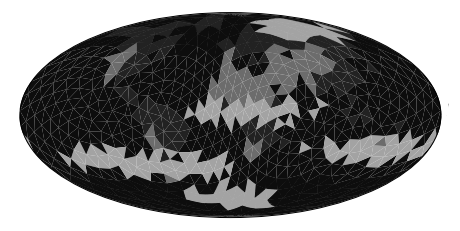

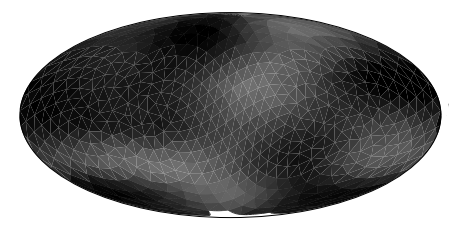

In [ ]:
pred = model.predict(test_curves[:,:,1].reshape(1,64))[0]

mollweide(faces, earth_wl[:,1])
mollweide(faces[visible_facets(axis_idx = 0).astype('bool')], pred)

Single Layers w/out Bias

In [ ]:
model = keras.Sequential()
model.add(Dense(stypes.shape[1], use_bias = False, input_shape = (64,)))
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()

model.fit(
    curves[:,:,:,3].reshape(-1,64),
    wl_albedos[:,:,3],
    epochs=1000,
    batch_size=32,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_7 (Dense)              (None, 681)               43584     
Total params: 43,584
Trainable params: 43,584
Non-trainable params: 0
_________________________________________________________________
Epoch 1/1000
249/249 [==============================] - 1s 2ms/step - loss: 0.0658 - val_loss: 0.0270
Epoch 2/1000
249/249 [==============================] - 0s 2ms/step - loss: 0.0278 - val_loss: 0.0266
Epoch 3/1000
249/249 [==============================] - 0s 2ms/step - loss: 0.0271 - val_loss: 0.0263
Epoch 4/1000
249/249 [==============================] - 0s 2ms/step - loss: 0.0274 - val_loss: 0.0259
Epoch 5/1000
249/249 [==============================] - 0s 2ms/step - loss: 0.0265 - val_loss: 0.0255
Epoch 6/1000
249/249 [==============================] - 0s 2ms/step - loss: 0.0260 - val_loss: 0.0252
Epoch 7/1000
249/249 [==========

Single Layer w/out Bias with Sigmoid

In [ ]:
def sig(x):
    return K.sigmoid(10 * (x-0.5))

model = keras.Sequential()
model.add(Dense(stypes.shape[1], use_bias = False, input_shape = (64,)))
model.add(Activation(sig))
model.compile(optimizer = 'adam', loss='mean_squared_error')

# model.summary()

model.fit(
    curves[:,:,:,1].reshape(-1,64),
    wl_albedos[:,:,1],
    epochs=1000,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Epoch 1/1000
128/128 [==============================] - 1s 3ms/step - loss: 0.1144 - val_loss: 0.0543
Epoch 2/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0529 - val_loss: 0.0534
Epoch 3/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0530 - val_loss: 0.0528
Epoch 4/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0520 - val_loss: 0.0521
Epoch 5/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0513 - val_loss: 0.0515
Epoch 6/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0508 - val_loss: 0.0510
Epoch 7/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0505 - val_loss: 0.0505
Epoch 8/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0495 - val_loss: 0.0502
Epoch 9/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0499 - val_loss: 0.0498
Epoch 10/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.049

Two Layers (Bias + No Bias)

In [ ]:
model = keras.Sequential()
model.add(Dense(64, input_shape = (64,), use_bias = True))
model.add(Dense(stypes.shape[1], use_bias = False))
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()

model.fit(
    curves[:,:,:,1].reshape(-1,64),
    wl_albedos[:,:,1],
    epochs=1000,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "sequential_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_40 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_41 (Dense)             (None, 996)               63744     
Total params: 67,904
Trainable params: 67,904
Non-trainable params: 0
_________________________________________________________________
Epoch 1/1000
128/128 [==============================] - 1s 4ms/step - loss: 0.0798 - val_loss: 0.0375
Epoch 2/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0367 - val_loss: 0.0366
Epoch 3/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0355 - val_loss: 0.0356
Epoch 4/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0345 - val_loss: 0.0349
Epoch 5/1000
128/128 [==============================] - 0s 3ms/step - loss: 0.0336 - val_loss: 0.0345
E

Two Layers (No Bias + No Bias)

In [ ]:
model = keras.Sequential()
model.add(Dense(64, input_shape = (64,), use_bias = False))
model.add(Dense(stypes.shape[1], use_bias = False))
model.compile(optimizer = 'adam', loss='mean_squared_error')

model.summary()

model.fit(
    curves[:,:,:,3].reshape(-1,64),
    wl_albedos[:,:,3],
    epochs=1000,
    batch_size=32,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 64)                4096      
_________________________________________________________________
dense_9 (Dense)              (None, 681)               43584     
Total params: 47,680
Trainable params: 47,680
Non-trainable params: 0
_________________________________________________________________
Epoch 1/1000
249/249 [==============================] - 1s 2ms/step - loss: 0.0601 - val_loss: 0.0270
Epoch 2/1000
249/249 [==============================] - 0s 2ms/step - loss: 0.0281 - val_loss: 0.0264
Epoch 3/1000
249/249 [==============================] - 0s 2ms/step - loss: 0.0271 - val_loss: 0.0254
Epoch 4/1000
249/249 [==============================] - 0s 2ms/step - loss: 0.0258 - val_loss: 0.0245
Epoch 5/1000
249/249 [==============================] - 0s 2ms/step - loss: 0.0252 - val_loss: 0.0241
Ep

With Curve Convolutions

Convolution without Bias - THIS IS THE BEST

In [ ]:
# number of visible facets:
num_vis_facets = np.sum(visible_facets(axis_idx = 57))

inputs = keras.Input(shape = (8,8,1))
x = conv_curves(inputs, kernel_size = 3, filters = 1, use_bias = False)
x = Flatten()(x)
x = Dense(64, use_bias = False)(x)
x = Dense(num_vis_facets, use_bias = False)(x)

model = keras.Model(inputs, x)
model.compile(optimizer = 'adam', loss='mse')

model.summary()

model.fit(
    curves[:,:,:,3].reshape(-1,8,8,1),
    wl_albedos[:,:,3],
    epochs=1000,
    batch_size=32,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

# model.load_weights('models/i45/three_layers_axis57')

Model: "model_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 8, 8, 1)]         0         
_________________________________________________________________
lambda_3 (Lambda)            (None, 8, 10, 1)          0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 1)           3         
_________________________________________________________________
flatten_3 (Flatten)          (None, 64)                0         
_________________________________________________________________
dense_12 (Dense)             (None, 64)                4096      
_________________________________________________________________
dense_13 (Dense)             (None, 681)               43584     
Total params: 47,683
Trainable params: 47,683
Non-trainable params: 0
_______________________________________________________

with Bias

In [ ]:
# number of visible facets:
num_vis_facets = np.sum(visible_facets(axis_idx = 0))

inputs = keras.Input(shape = (8,8,1))
x = conv_curves(inputs, kernel_size = 3, filters = 1, use_bias = True)
x = Flatten()(x)
x = Dense(64, use_bias = False)(x)
x = Dense(num_vis_facets, use_bias = False)(x)

model = keras.Model(inputs, x)
model.compile(optimizer = 'adam', loss='mse')

model.summary()

model.fit(
    curves[:,:,:,1].reshape(-1,8,8,1),
    wl_albedos[:,:,1],
    epochs=1000,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "model_13"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_19 (InputLayer)        [(None, 8, 8, 1)]         0         
_________________________________________________________________
lambda_54 (Lambda)           (None, 8, 10, 1)          0         
_________________________________________________________________
conv2d_25 (Conv2D)           (None, 8, 8, 1)           4         
_________________________________________________________________
flatten_21 (Flatten)         (None, 64)                0         
_________________________________________________________________
dense_48 (Dense)             (None, 64)                4096      
_________________________________________________________________
dense_49 (Dense)             (None, 996)               63744     
Total params: 67,844
Trainable params: 67,844
Non-trainable params: 0
______________________________________________________

With Spherical Convolutions

In [ ]:
idx_0 = np.array(range(1000))
idx_1 = np.load('data/fib_convolutions/idx_1.npy')
idx_2 = np.load('data/fib_convolutions/idx_2.npy')
idx_3 = np.load('data/fib_convolutions/idx_3.npy')
idx_4 = np.load('data/fib_convolutions/idx_4.npy')
idx_5 = np.load('data/fib_convolutions/idx_5.npy')

def sphere_conv(x, rings = 1, filters = 4, axis = 0, activation = None):
    kernel_size = [1, 13, 37, 72, 118, 174][rings]
    idx = [idx_0, idx_1, idx_2, idx_3, idx_4, idx_5][rings]

    # remove all rows for which the facet is not visible:
    vis = visible_facets(axis_idx = axis)
    bad_idx = np.where(vis == 0)[0]
    good_idx = np.where(vis == 1)[0]

    idx = idx.reshape((1000, kernel_size))
    idx = np.delete(idx, bad_idx, axis = 0)

    # repeat some elements if there are elements that aren't visible in the rows
    idx = np.array([row[[np.where(np.amax(row[None, :ind + 1] == good_idx[:, None],
                                          axis = 0))[0][-1]
                         for ind in range(len(row))]]
                    for row in idx])

    # change the indices to match the new indexing:
    idx = idx.reshape((-1))
    idx -= np.array([np.count_nonzero(vis[:i] == 0) for i in idx])

    x = Lambda(lambda x: tf.gather(x, idx, axis = 1))(x)
    x = Conv1D(filters = filters, kernel_size = kernel_size,
               strides = kernel_size, activation = activation,
               kernel_initializer='zeros', bias_initializer='zeros')(x)

    return x

In [ ]:
# number of visible facets:
num_vis_facets = np.sum(visible_facets(axis_idx = 0))

inputs = keras.Input(shape = (8,8,1))
x = conv_curves(inputs, kernel_size = 3, filters = 1)
x = Flatten()(x)
x = Dense(64)(x)
x = Dense(num_vis_facets)(x)
output_block_1 = Reshape((num_vis_facets, 1))(x)

# spherical convolutions:
x = sphere_conv(output_block_1, rings = 1, filters = 1, axis = 0)
output_block_2 = add([x, output_block_1])

x = sphere_conv(output_block_2, rings = 1, filters = 1, axis = 0)
output_block_3 = add([x, output_block_2])

output = Flatten()(output_block_3)

# create and show architecture:
model = keras.Model(inputs, output)
model.compile(optimizer = 'adam', loss='mse')
model.summary()

model.fit(
    curves[:,:,:,1].reshape(-1,8,8,1),
    wl_albedos[:,:,1],
    epochs=1000,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "model_10"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_16 (InputLayer)           [(None, 8, 8, 1)]    0                                            
__________________________________________________________________________________________________
lambda_49 (Lambda)              (None, 8, 10, 1)     0           input_16[0][0]                   
__________________________________________________________________________________________________
conv2d_22 (Conv2D)              (None, 8, 8, 1)      4           lambda_49[0][0]                  
__________________________________________________________________________________________________
flatten_17 (Flatten)            (None, 64)           0           conv2d_22[0][0]                  
___________________________________________________________________________________________

Testing

0.1116 0.6494


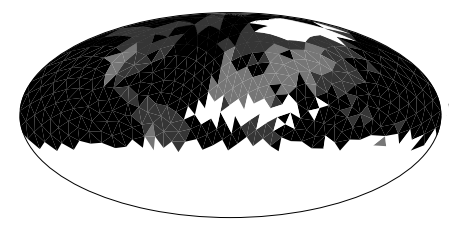

In [ ]:
earth_stypes = np.load('data/earth_surface_types.npy')
clouds = np.load('data/clouds.npy')
earth_stypes = combine(earth_stypes, clouds[21])
earth_wl = albedos[earth_stypes]

axis_ind = 57

print(np.min(earth_wl[:,3]), np.max(earth_wl[:,3]))
plot_colors =  earth_wl[:,3] - np.min(earth_wl[:,3])
plot_colors /= np.max(plot_colors)
mollweide(faces[visible_facets(axis_idx = axis_ind).astype('bool')],
          plot_colors[visible_facets(axis_idx = axis_ind).astype('bool')])
plt.show()

# print()
# print('WORST CASE:')
# i = 0
# axis_ind = 60

# num_vis_facets = np.sum(visible_facets(axis_idx = axis_ind))
# inputs = keras.Input(shape = (8,8,1))
# x = conv_curves(inputs, kernel_size = 3, filters = 1, use_bias = False)
# x = Flatten()(x)
# x = Dense(64, use_bias = False)(x)
# x = Dense(num_vis_facets, use_bias = False)(x)
# model = keras.Model(inputs, x)
# model.compile(optimizer = 'adam', loss='mse')
# model.load_weights('models/i' + str(i) + '/three_layers_axis' + str(axis_ind))

# test_curves = earth_curves(rot_axis = axes[axis_ind], incl = i,
#                            clouds_ind = 21, fourier = False)

# pred = model.predict(test_curves[:,:,3].reshape(1,8,8,1))[0]

# plot_colors =  pred - np.min(earth_wl[:,3])
# plot_colors /= np.max(earth_wl[:,3] - np.min(earth_wl[:,3]))

# mollweide(faces[visible_facets(axis_idx = axis_ind).astype('bool')], plot_colors)
# plt.show()
# mse = np.mean((pred - earth_wl[visible_facets(axis_idx = axis_ind).astype('bool'), 3])**2)

# print('mse: ', mse)

# print()
# print('BEST CASE:')
# i = 45
# axis_ind = 57

# num_vis_facets = np.sum(visible_facets(axis_idx = axis_ind))
# inputs = keras.Input(shape = (8,8,1))
# x = conv_curves(inputs, kernel_size = 3, filters = 1, use_bias = False)
# x = Flatten()(x)
# x = Dense(64, use_bias = False)(x)
# x = Dense(num_vis_facets, use_bias = False)(x)
# model = keras.Model(inputs, x)
# model.compile(optimizer = 'adam', loss='mse')
# model.load_weights('models/i' + str(i) + '/three_layers_axis' + str(axis_ind))

# test_curves = earth_curves(rot_axis = axes[axis_ind], incl = i * np.pi/180,
#                            clouds_ind = 21, fourier = False)

# pred = model.predict(test_curves[:,:,3].reshape(1,8,8,1))[0]
# plot_colors =  pred - np.min(earth_wl[:,3])
# plot_colors /= np.max(earth_wl[:,3] - np.min(earth_wl[:,3]))
# mollweide(faces[visible_facets(axis_idx = axis_ind).astype('bool')], plot_colors)
# plt.show()
# mse = np.mean((pred - earth_wl[visible_facets(axis_idx = axis_ind).astype('bool'), 3])**2)

# print('mse: ', mse)


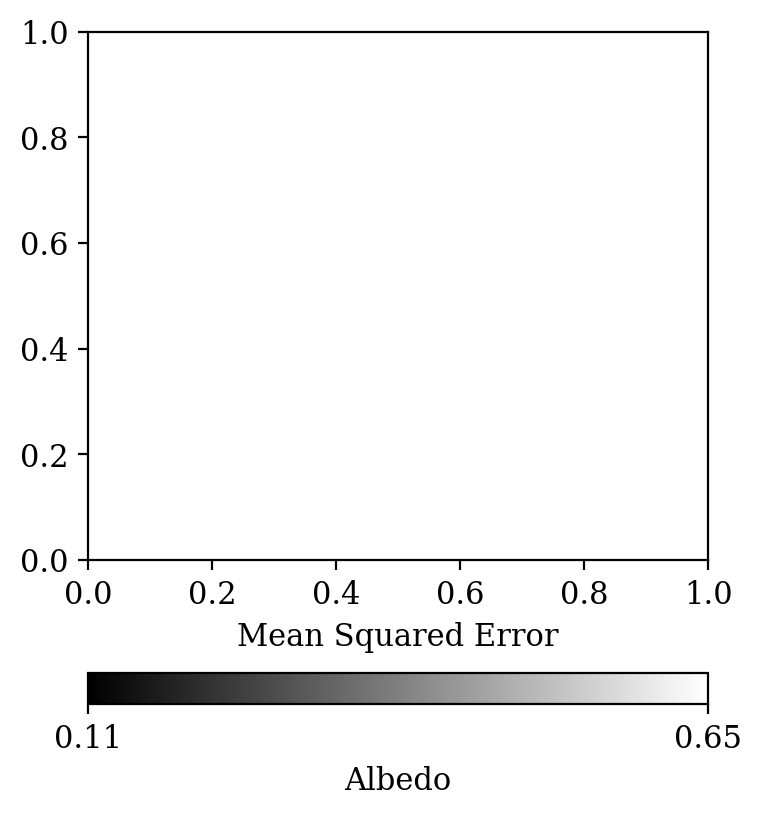

In [ ]:
fig = plt.figure(figsize = (4, 5), dpi = 200)
fig.set_facecolor('white')

norm = mcolors.Normalize(0, 1)

cmap = LinearSegmentedColormap.from_list('mycmap',
                                         ['black', 'white'])

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)

cbar = fig.colorbar(sm, orientation = 'horizontal', ticks = [0, 1])
cbar.set_label('Albedo')

start = 0.1116
end = 0.6494

start = np.round(start, decimals = 2)
end = np.round(end, decimals = 2)

plt.xlabel('Mean Squared Error')

cbar.ax.set_xticklabels([start, end])  # vertically oriented colorbar

plt.show()

In [ ]:
print(np.mean((pred - earth_wl[visible_facets(axis_idx = axis_ind).astype('bool'), 3])**2))

0.02859784


# Different Architectures For Relative Curves


Load Data

In [ ]:
load_data(i = 30, axis_idx = 57,
          norm = True, fourier = False, maps = True, polarization = False)

curves:  (8956, 8, 8, 6)
combos:  (8956, 4)
axes:    (8956, 3)
stypes:  (8956, 681, 4)


In [ ]:
stype_idx = np.argmax(stypes, axis = 2)
wl_albedos = albedos[stype_idx]
print(wl_albedos.shape)

(8956, 681, 6)


Same Architecture as Before

In [ ]:
# number of visible facets:
num_vis_facets = np.sum(visible_facets(axis_idx = 57))

inputs = keras.Input(shape = (8,8,1))
x = conv_curves(inputs, kernel_size = 3, filters = 1, use_bias = False)
x = Flatten()(x)
x = Dense(64, use_bias = False)(x)
x = Dense(num_vis_facets, use_bias = False)(x)

model_old = keras.Model(inputs, x)
model_old.compile(optimizer = 'adam', loss='mse')

model_old.summary()

model_old.fit(
    curves[:,:,:,3].reshape(-1,8,8,1),
    wl_albedos[:,:,3],
    epochs=1000,
    batch_size=32,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "model_30"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_31 (InputLayer)        [(None, 8, 8, 1)]         0         
_________________________________________________________________
lambda_30 (Lambda)           (None, 8, 10, 1)          0         
_________________________________________________________________
conv2d_30 (Conv2D)           (None, 8, 8, 1)           3         
_________________________________________________________________
flatten_37 (Flatten)         (None, 64)                0         
_________________________________________________________________
dense_95 (Dense)             (None, 64)                4096      
_________________________________________________________________
dense_96 (Dense)             (None, 681)               43584     
Total params: 47,683
Trainable params: 47,683
Non-trainable params: 0
______________________________________________________

New

In [ ]:
num_vis_facets = np.sum(visible_facets(axis_idx = 57))

ip = keras.Input(shape = (8,8,1))

x1 = conv_curves(ip, kernel_size = 3, filters = 1, use_bias = False)
x2 = Flatten()(x1)
x3 = Dense(96, input_shape = (96,), use_bias = False)(x2)
x4 = Dense(num_vis_facets, input_shape = (96,), use_bias = False)(x3)

y0 = Flatten()(ip)
y1 = Dense(32, activation = 'relu')(y0)
y2 = Dense(32, activation = 'relu')(y1)
y3 = Dense(32, activation = 'relu')(y2)
y4 = Dense(1)(y3)
y5 = Dense(1)(y3)

x5 = Multiply()([x4, y4])
x6 = Add()([x5, y5])

model = keras.Model(ip, x6)
model.compile(optimizer = 'adam', loss='mse')
model.summary()

keras.utils.plot_model(model, show_shapes=True)

model.fit(
    curves[:,:,:,3].reshape(-1,8,8,1),
    wl_albedos[:,:,3],
    epochs=1000,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "model_23"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_24 (InputLayer)           [(None, 8, 8, 1)]    0                                            
__________________________________________________________________________________________________
lambda_23 (Lambda)              (None, 8, 10, 1)     0           input_24[0][0]                   
__________________________________________________________________________________________________
flatten_25 (Flatten)            (None, 64)           0           input_24[0][0]                   
__________________________________________________________________________________________________
conv2d_23 (Conv2D)              (None, 8, 8, 1)      3           lambda_23[0][0]                  
___________________________________________________________________________________________

In [ ]:
num_vis_facets = np.sum(visible_facets(axis_idx = 57))

ip = keras.Input(shape = (8,8,1))

x1 = conv_curves(ip, kernel_size = 3, filters = 1, use_bias = False)
x2 = Flatten()(x1)
x3 = Dense(96, input_shape = (96,), use_bias = False)(x2)
x4 = Dense(num_vis_facets, input_shape = (96,), use_bias = False)(x3)

y0 = Flatten()(x1)
y1 = Dense(32, activation = 'relu')(y0)
y2 = Dense(32, activation = 'relu')(y1)
y3 = Dense(32, activation = 'relu')(y2)
y4 = Dense(1)(y3)
y5 = Dense(1)(y3)

x5 = Multiply()([x4, y4])
x6 = Add()([x5, y5])

model = keras.Model(ip, x6)
model.compile(optimizer = 'adam', loss='mse')
model.summary()

keras.utils.plot_model(model, show_shapes=True)

model.fit(
    curves[:,:,:,4].reshape(-1,8,8,1),
    wl_albedos[:,:,4],
    epochs=1000,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "model_8"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_10 (InputLayer)           [(None, 8, 8, 1)]    0                                            
__________________________________________________________________________________________________
lambda_8 (Lambda)               (None, 8, 10, 1)     0           input_10[0][0]                   
__________________________________________________________________________________________________
conv2d_8 (Conv2D)               (None, 8, 8, 1)      3           lambda_8[0][0]                   
__________________________________________________________________________________________________
flatten_11 (Flatten)            (None, 64)           0           conv2d_8[0][0]                   
____________________________________________________________________________________________

with PReLU (this is worse)

In [ ]:
num_vis_facets = np.sum(visible_facets(axis_idx = 0))

ip = keras.Input(shape = (8,8,1))

x1 = conv_curves(ip, kernel_size = 3, filters = 1, use_bias = False)
x2 = Flatten()(x1)
x3 = Dense(96, input_shape = (96,), use_bias = False)(x2)
x4 = Dense(num_vis_facets, input_shape = (96,), use_bias = False)(x3)

y0 = Flatten()(x1)
y1 = Dense(32)(y0)
y11 = PReLU()(y1)
y2 = Dense(32)(y11)
y21 = PReLU()(y2)
y3 = Dense(32)(y21)
y31 = PReLU()(y3)
y4 = Dense(1)(y31)
y5 = Dense(1)(y31)

x5 = Multiply()([x4, y4])
x6 = Add()([x5, y5])

model = keras.Model(ip, x6)
model.compile(optimizer = 'adam', loss='mse')
model.summary()

keras.utils.plot_model(model, show_shapes=True)

model.fit(
    curves[:,:,:,1].reshape(-1,8,8,1),
    wl_albedos[:,:,1],
    epochs=1000,
    batch_size=64,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "model_30"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_39 (InputLayer)           [(None, 8, 8, 1)]    0                                            
__________________________________________________________________________________________________
lambda_69 (Lambda)              (None, 8, 10, 1)     0           input_39[0][0]                   
__________________________________________________________________________________________________
conv2d_39 (Conv2D)              (None, 8, 8, 1)      3           lambda_69[0][0]                  
__________________________________________________________________________________________________
flatten_46 (Flatten)            (None, 64)           0           conv2d_39[0][0]                  
___________________________________________________________________________________________

# Different Noise Levels

load data

In [ ]:
load_data(i = 45, axis_idx = 57,
          norm = True, fourier = False, maps = True, polarization = False)

stype_idx = np.argmax(stypes, axis = 2)
wl_albedos = albedos[stype_idx]

curves:  (8849, 8, 8, 6)
combos:  (8849, 4)
axes:    (8849, 3)
stypes:  (8849, 681, 4)


create model and train for no noise

In [ ]:
num_vis_facets = np.sum(visible_facets(axis_idx = 57))

ip = keras.Input(shape = (8,8,1))

x1 = conv_curves(ip, kernel_size = 3, filters = 1, use_bias = False)
x2 = Flatten()(x1)
x3 = Dense(96, input_shape = (96,), use_bias = False)(x2)
x4 = Dense(num_vis_facets, input_shape = (96,), use_bias = False)(x3)

y0 = Flatten()(ip)
y1 = Dense(32, activation = 'relu')(y0)
y2 = Dense(32, activation = 'relu')(y1)
y3 = Dense(32, activation = 'relu')(y2)
y4 = Dense(1)(y3)
y5 = Dense(1)(y3)

x5 = Multiply()([x4, y4])
x6 = Add()([x5, y5])

model = keras.Model(ip, x6)
model.compile(optimizer = 'adam', loss='mse')
model.summary()

model.fit(
    curves[:,:,:,3].reshape(-1,8,8,1),
    wl_albedos[:,:,3],
    epochs=1000,
    batch_size=32,
    validation_split=0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience=10)]
)

Model: "model_31"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_32 (InputLayer)           [(None, 8, 8, 1)]    0                                            
__________________________________________________________________________________________________
lambda_31 (Lambda)              (None, 8, 10, 1)     0           input_32[0][0]                   
__________________________________________________________________________________________________
flatten_39 (Flatten)            (None, 64)           0           input_32[0][0]                   
__________________________________________________________________________________________________
conv2d_31 (Conv2D)              (None, 8, 8, 1)      3           lambda_31[0][0]                  
___________________________________________________________________________________________



 ------  N_max = inf -------

curves:  (8849, 8, 8, 6)
combos:  (8849, 4)
axes:    (8849, 3)

VALIDATION DATA
28/28 [==============================] - 0s 1ms/step - loss: 0.0162

EARTH


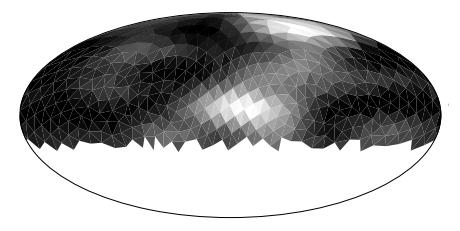

mse:  0.014189598


 ------  N_max = 100000.0 -------

curves:  (8849, 8, 8, 6)
combos:  (8849, 4)
axes:    (8849, 3)
Epoch 1/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0228 - val_loss: 0.0206
Epoch 2/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0205 - val_loss: 0.0197
Epoch 3/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0200 - val_loss: 0.0194
Epoch 4/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0197 - val_loss: 0.0192
Epoch 5/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0196 - val_loss: 0.0191
Epoch 6/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0194 - val_loss: 0.0189
Epoch 7/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0193 - val_loss: 0.0189
Epoch 8/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0192 - val_loss: 0.0190
Epoch 9/1000
249/249 [==============================] - 1s 3ms/ste

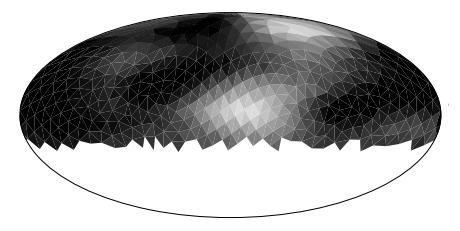

mse:  0.014577321


 ------  N_max = 10000.0 -------

curves:  (8849, 8, 8, 6)
combos:  (8849, 4)
axes:    (8849, 3)
Epoch 1/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0225 - val_loss: 0.0214
Epoch 2/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0216 - val_loss: 0.0212
Epoch 3/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0215 - val_loss: 0.0212
Epoch 4/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0214 - val_loss: 0.0210
Epoch 5/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0214 - val_loss: 0.0209
Epoch 6/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0213 - val_loss: 0.0213
Epoch 7/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0213 - val_loss: 0.0210
Epoch 8/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0212 - val_loss: 0.0209
Epoch 9/1000
249/249 [==============================] - 1s 3ms/step

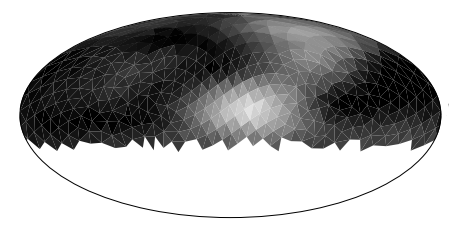

mse:  0.01571866


 ------  N_max = 1000.0 -------

curves:  (8849, 8, 8, 6)
combos:  (8849, 4)
axes:    (8849, 3)
Epoch 1/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0257 - val_loss: 0.0247
Epoch 2/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0248 - val_loss: 0.0241
Epoch 3/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0245 - val_loss: 0.0240
Epoch 4/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0244 - val_loss: 0.0241
Epoch 5/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0244 - val_loss: 0.0238
Epoch 6/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0243 - val_loss: 0.0240
Epoch 7/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0243 - val_loss: 0.0239
Epoch 8/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0243 - val_loss: 0.0238
Epoch 9/1000
249/249 [==============================] - 1s 3ms/step -

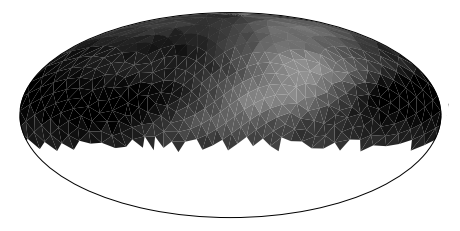

mse:  0.018431176


 ------  N_max = 100.0 -------

curves:  (8849, 8, 8, 6)
combos:  (8849, 4)
axes:    (8849, 3)
Epoch 1/1000
249/249 [==============================] - 1s 4ms/step - loss: 0.0302 - val_loss: 0.0286
Epoch 2/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0292 - val_loss: 0.0283
Epoch 3/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0290 - val_loss: 0.0283
Epoch 4/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0289 - val_loss: 0.0284
Epoch 5/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0289 - val_loss: 0.0281
Epoch 6/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0288 - val_loss: 0.0281
Epoch 7/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0288 - val_loss: 0.0281
Epoch 8/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0287 - val_loss: 0.0281
Epoch 9/1000
249/249 [==============================] - 1s 3ms/step -

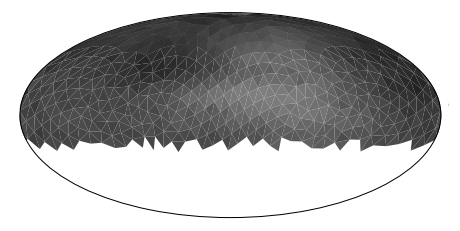

mse:  0.026171865


 ------  N_max = 10.0 -------

curves:  (8849, 8, 8, 6)
combos:  (8849, 4)
axes:    (8849, 3)
Epoch 1/1000
249/249 [==============================] - 1s 4ms/step - loss: 0.0360 - val_loss: 0.0339
Epoch 2/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0342 - val_loss: 0.0345
Epoch 3/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0339 - val_loss: 0.0337
Epoch 4/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0336 - val_loss: 0.0334
Epoch 5/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0334 - val_loss: 0.0338
Epoch 6/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0332 - val_loss: 0.0335
Epoch 7/1000
249/249 [==============================] - 1s 4ms/step - loss: 0.0330 - val_loss: 0.0336
Epoch 8/1000
249/249 [==============================] - 1s 3ms/step - loss: 0.0329 - val_loss: 0.0334
Epoch 9/1000
249/249 [==============================] - 1s 4ms/step - 

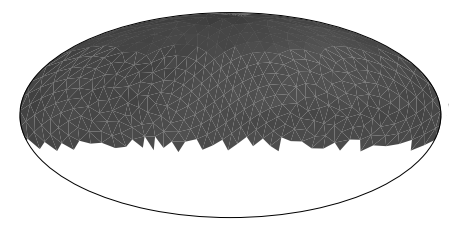

mse:  0.02835998


In [ ]:
for N_max in [np.inf, 1e5, 1e4, 1e3, 1e2, 1e1]:
    print()
    print()
    print(' ------  N_max = ' + str(N_max) + ' -------')
    print()

    load_data(i = 45, axis_idx = 57, norm = True, fourier = False, maps = False,
              polarization = False, N_max = N_max)

    if N_max != np.inf:
        model.fit(
            curves[:,:,:,3].reshape(-1,8,8,1),
            wl_albedos[:,:,3],
            epochs=1000,
            batch_size=32,
            validation_split=0.1,
            callbacks=[keras.callbacks.EarlyStopping(patience=10)]
        )

    print()
    print('VALIDATION DATA')
    model.evaluate(curves[-885:,:,:,3].reshape(-1,8,8,1),
                   wl_albedos[-885:,:,3])

    print()
    print('EARTH')
    if N_max != np.inf:
        c = noise_curves(test_curves, N_max = N_max, polarization = False)
    else:
        c = test_curves
    c = normalize(c.reshape((1,8,8,6)), polarization = False)[0]
    pred = model.predict(c[:,:,3].reshape(1,8,8,1))[0]
    plot_colors =  pred - np.min(earth_wl[:,3])
    plot_colors /= np.max(earth_wl[:,3] - np.min(earth_wl[:,3]))
    mollweide(faces[visible_facets(axis_idx = axis_ind).astype('bool')], plot_colors)
    plt.show()
    mse = np.mean((pred - earth_wl[visible_facets(axis_idx = axis_ind).astype('bool'), 3])**2)

    print('mse: ', mse)

# Comparing Directional

find the zero tilt axis



 ---------- incl = 0 [deg] ---------- 
[0. 0. 1.]
[-0.04246048  0.3937252   0.91824701]

----- 800 nm -----
curves:  (8960, 8, 8, 6)
combos:  (8960, 4)
axes:    (8960, 3)
stypes:  (8960, 1000, 4)
curves:  (8960, 8, 8, 6)
combos:  (8960, 4)
axes:    (8960, 3)
stypes:  (8960, 1000, 4)
Ocean Planet


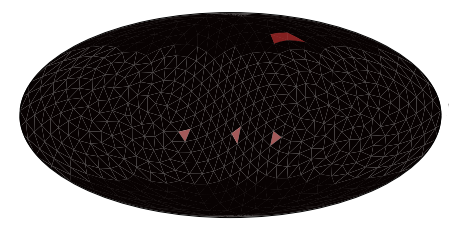

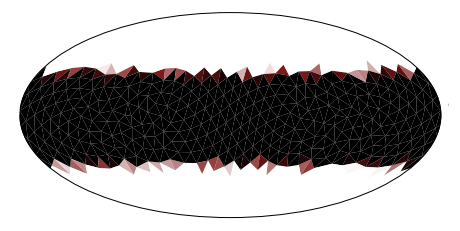

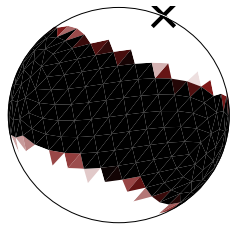

Desert Planet


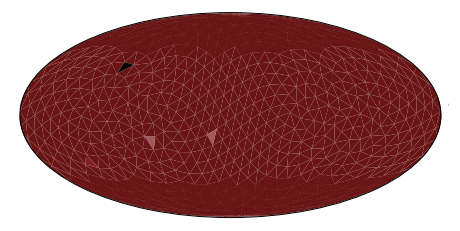

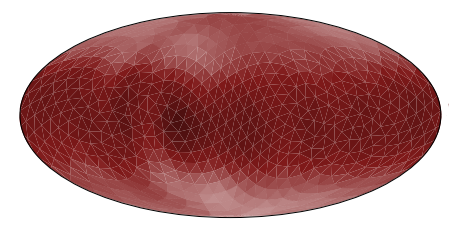

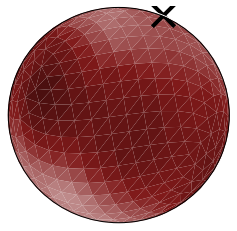

Vegetation Planet


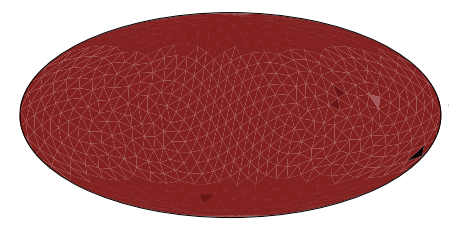

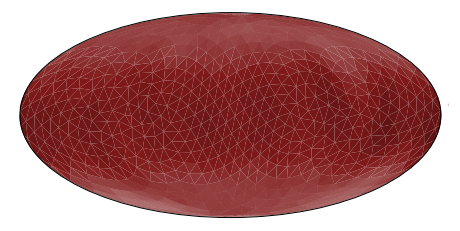

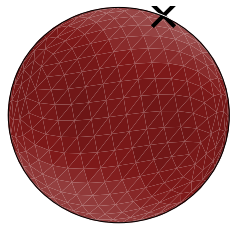

Cloudy Planet


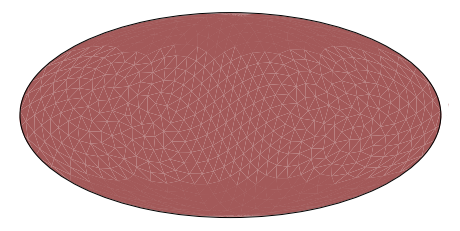

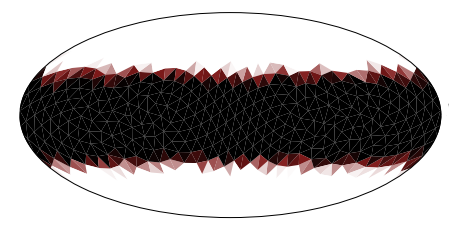

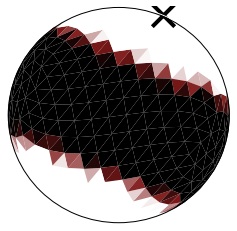


----- 400 nm -----
curves:  (8960, 8, 8, 6)
combos:  (8960, 4)
axes:    (8960, 3)
stypes:  (8960, 1000, 4)
curves:  (8960, 8, 8, 6)
combos:  (8960, 4)
axes:    (8960, 3)
stypes:  (8960, 1000, 4)
Ocean Planet


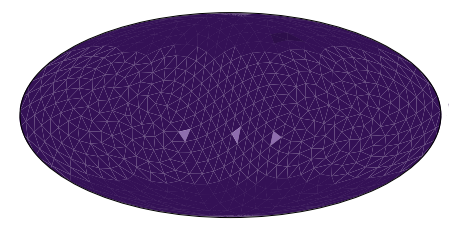

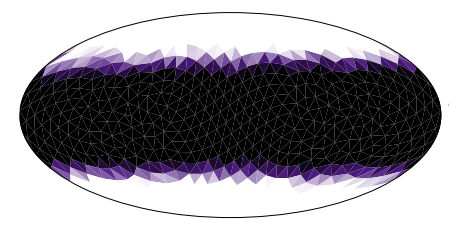

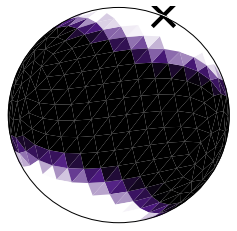

Desert Planet


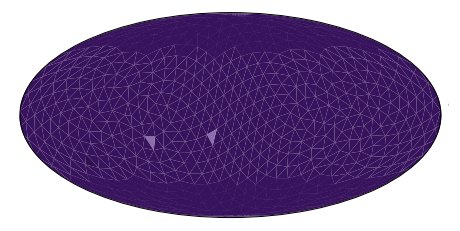

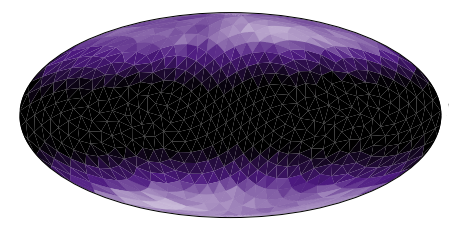

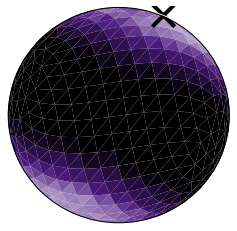

Vegetation Planet


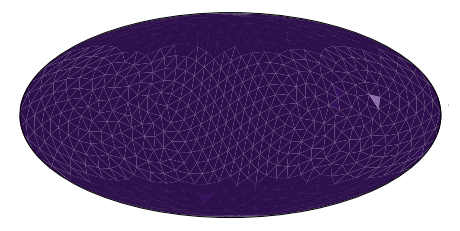

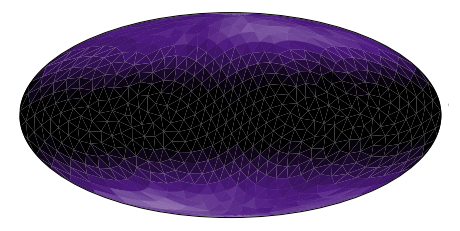

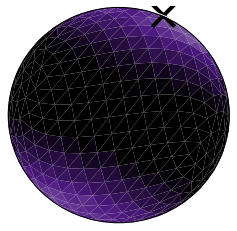

Cloudy Planet


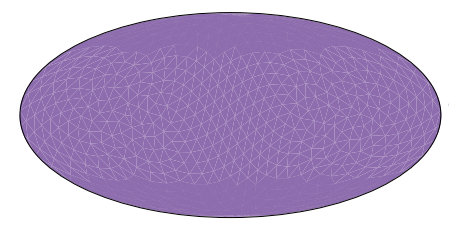

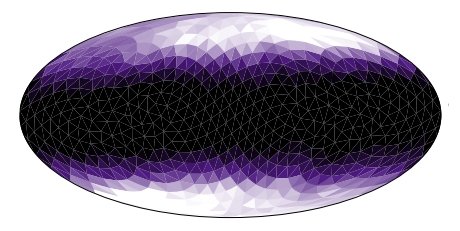

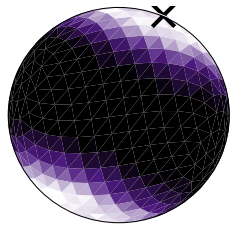



 ---------- incl = 30 [deg] ---------- 
[0.5       0.        0.8660254]
[ 0.38216332 -0.14174107  0.91315972]

----- 800 nm -----
curves:  (8951, 8, 8, 6)
combos:  (8951, 4)
axes:    (8951, 3)
stypes:  (8951, 960, 4)
curves:  (8951, 8, 8, 6)
combos:  (8951, 4)
axes:    (8951, 3)
stypes:  (8951, 960, 4)
Ocean Planet


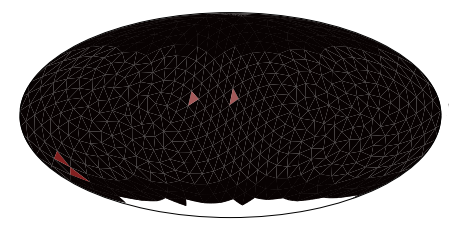

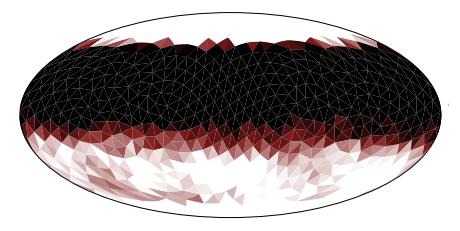

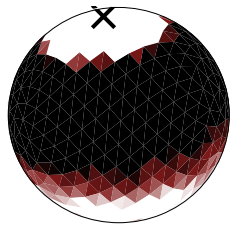

Desert Planet


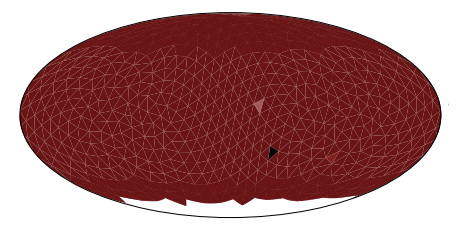

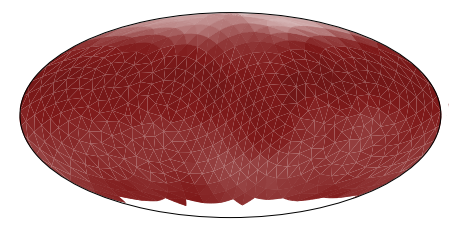

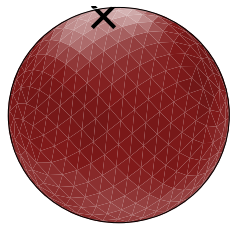

Vegetation Planet


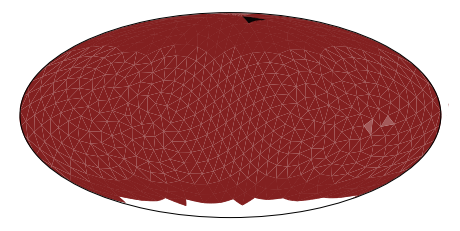

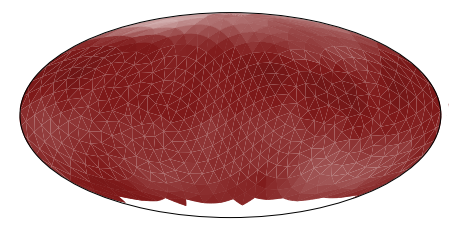

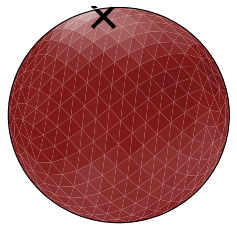

Cloudy Planet


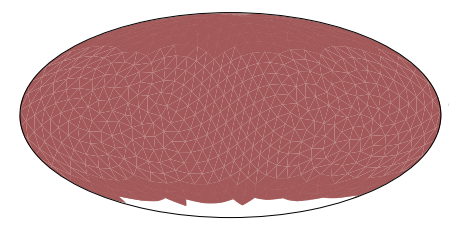

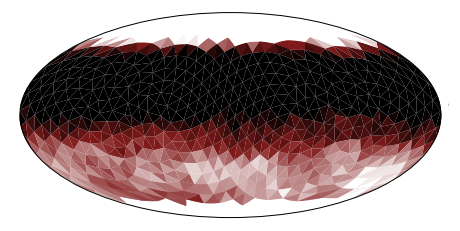

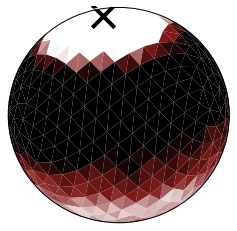


----- 400 nm -----
curves:  (8951, 8, 8, 6)
combos:  (8951, 4)
axes:    (8951, 3)
stypes:  (8951, 960, 4)
curves:  (8951, 8, 8, 6)
combos:  (8951, 4)
axes:    (8951, 3)
stypes:  (8951, 960, 4)
Ocean Planet


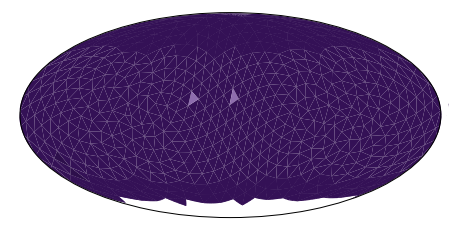

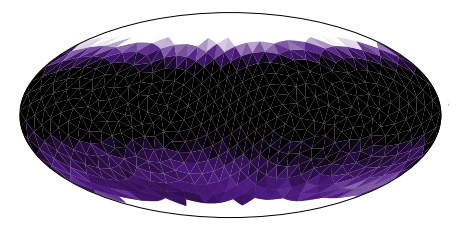

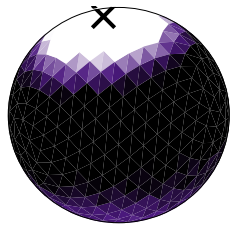

Desert Planet


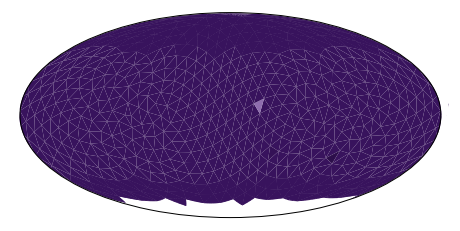

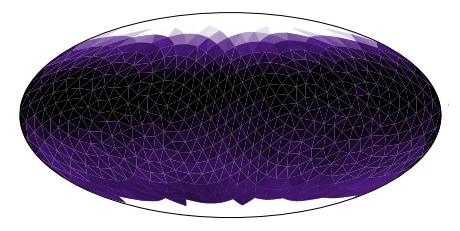

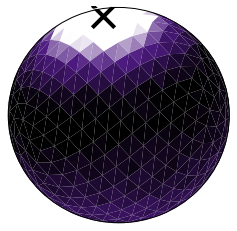

Vegetation Planet


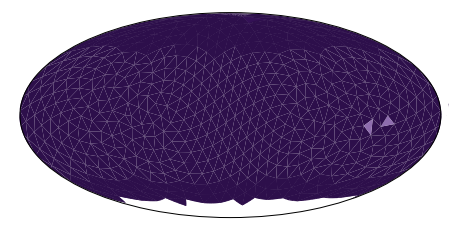

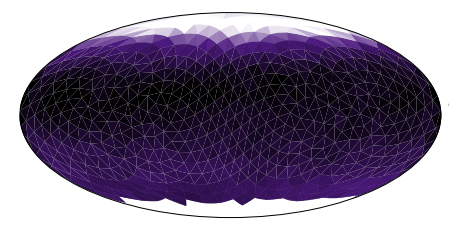

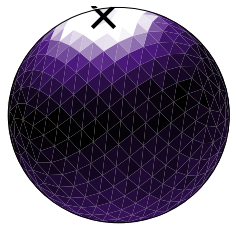

Cloudy Planet


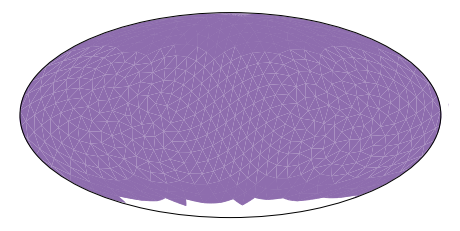

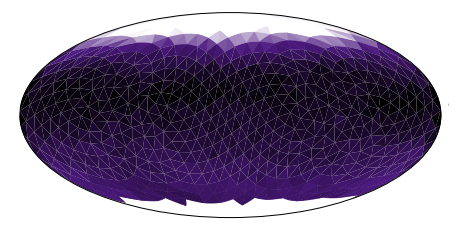

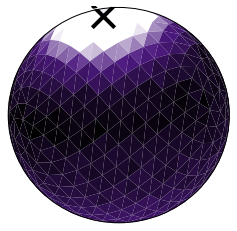



 ---------- incl = 60 [deg] ---------- 
[0.8660254 0.        0.5      ]
[0.88244074 0.07874504 0.46378612]

----- 800 nm -----
curves:  (9038, 8, 8, 6)
combos:  (9038, 4)
axes:    (9038, 3)
stypes:  (9038, 734, 4)
curves:  (9038, 8, 8, 6)
combos:  (9038, 4)
axes:    (9038, 3)
stypes:  (9038, 734, 4)
Ocean Planet


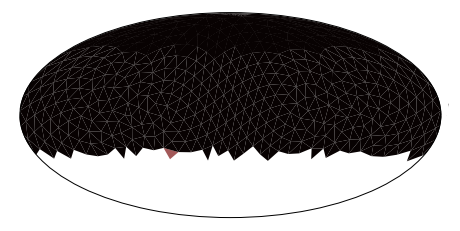

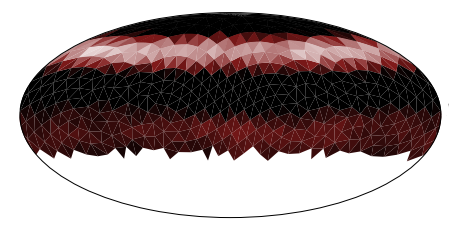

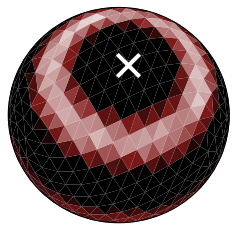

Desert Planet


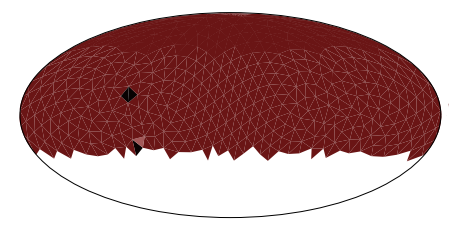

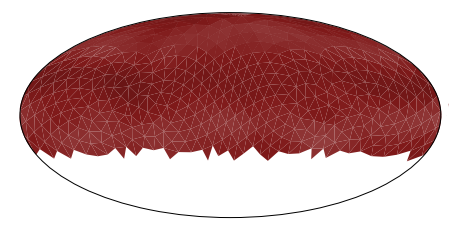

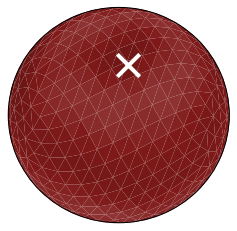

Vegetation Planet


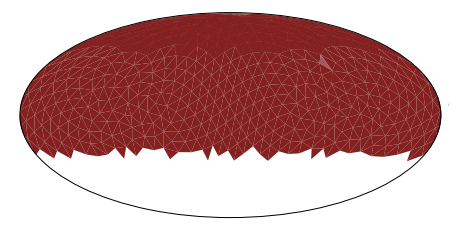

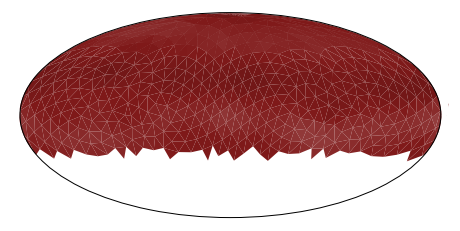

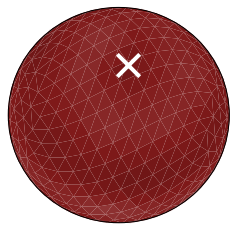

Cloudy Planet


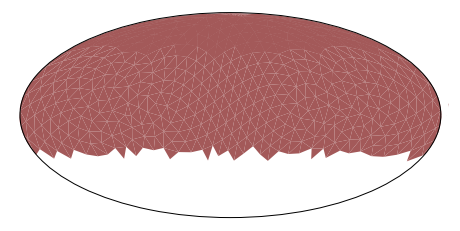

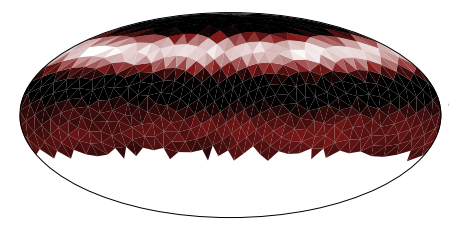

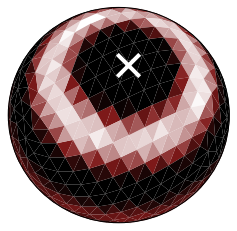


----- 400 nm -----
curves:  (9038, 8, 8, 6)
combos:  (9038, 4)
axes:    (9038, 3)
stypes:  (9038, 734, 4)
curves:  (9038, 8, 8, 6)
combos:  (9038, 4)
axes:    (9038, 3)
stypes:  (9038, 734, 4)
Ocean Planet


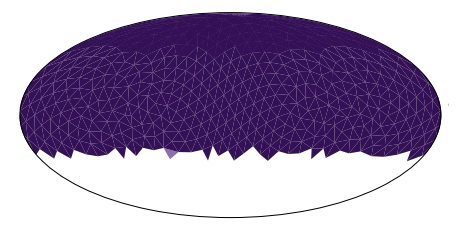

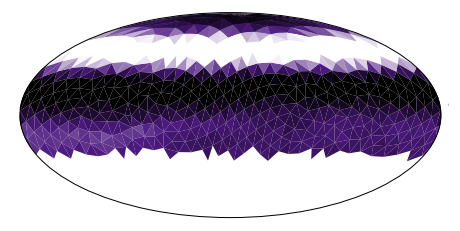

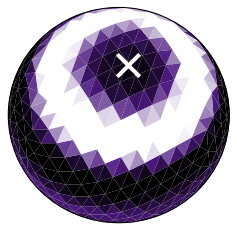

Desert Planet


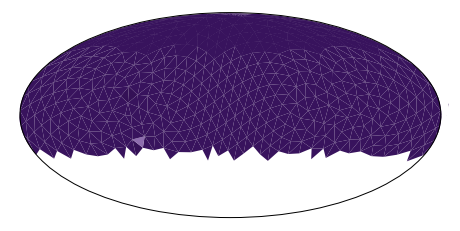

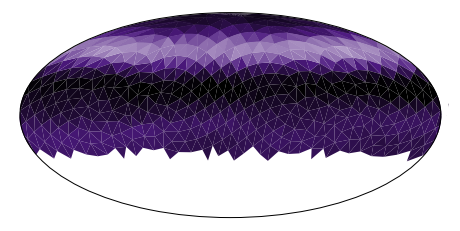

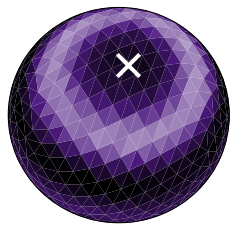

Vegetation Planet


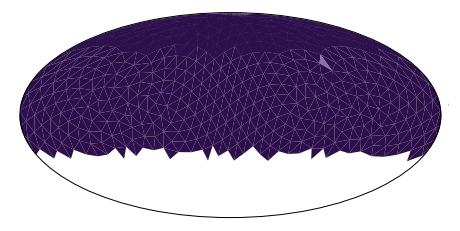

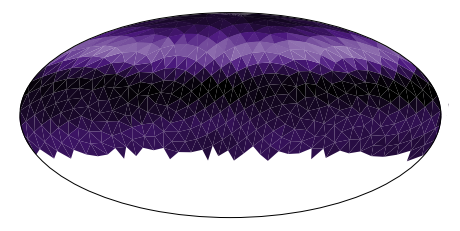

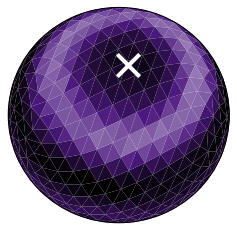

Cloudy Planet


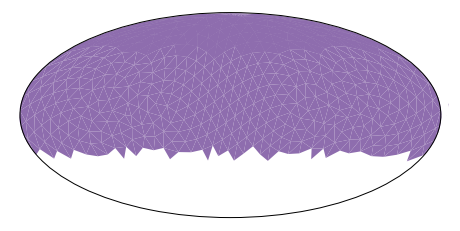

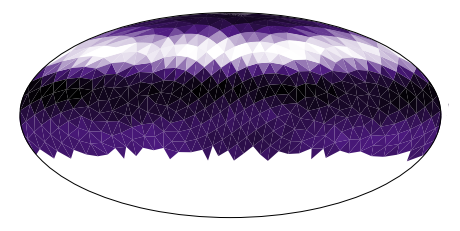

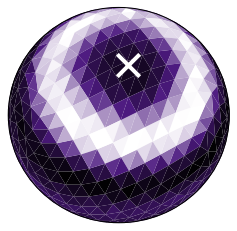



 ---------- incl = 90 [deg] ---------- 
[1.000000e+00 0.000000e+00 6.123234e-17]
[ 0.96589013 -0.04724702  0.25460554]

----- 800 nm -----
curves:  (8873, 8, 8, 6)
combos:  (8873, 4)
axes:    (8873, 3)
stypes:  (8873, 628, 4)
curves:  (8873, 8, 8, 6)
combos:  (8873, 4)
axes:    (8873, 3)
stypes:  (8873, 628, 4)
Ocean Planet


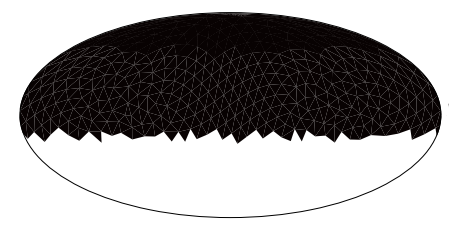

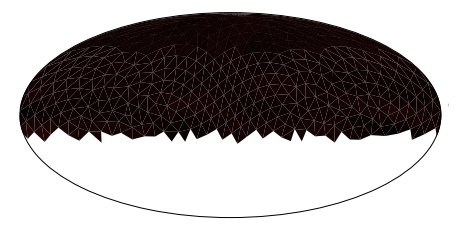

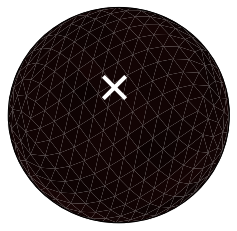

Desert Planet


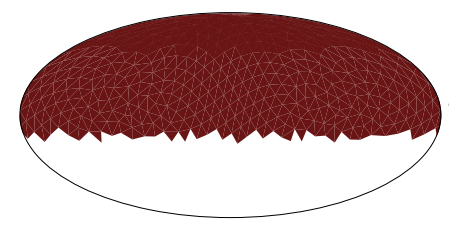

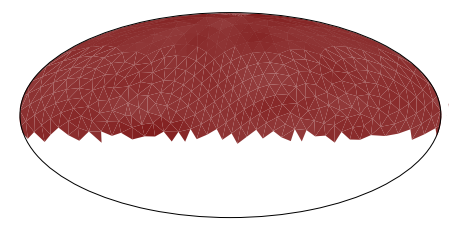

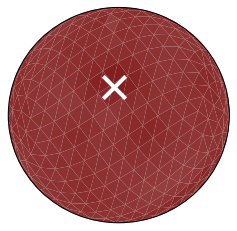

Vegetation Planet


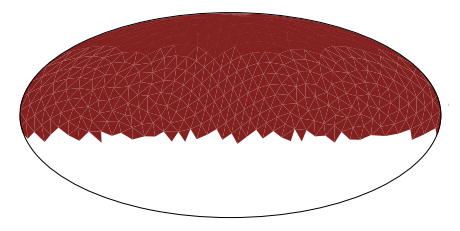

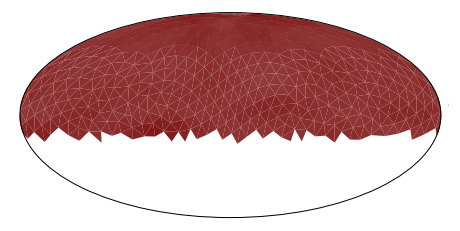

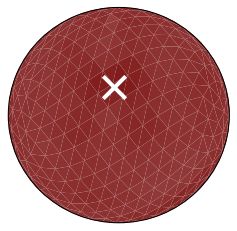

Cloudy Planet


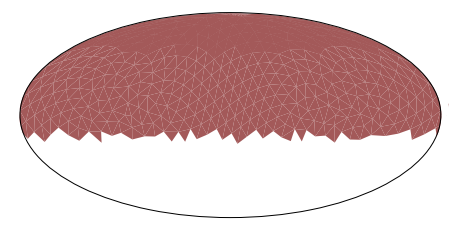

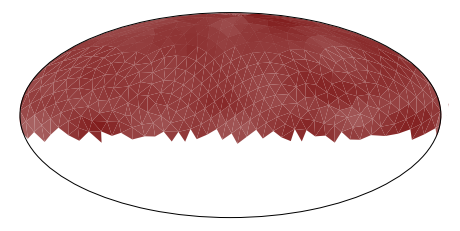

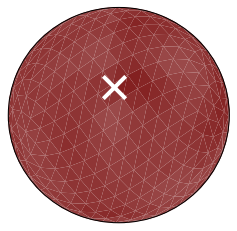


----- 400 nm -----
curves:  (8873, 8, 8, 6)
combos:  (8873, 4)
axes:    (8873, 3)
stypes:  (8873, 628, 4)
curves:  (8873, 8, 8, 6)
combos:  (8873, 4)
axes:    (8873, 3)
stypes:  (8873, 628, 4)
Ocean Planet


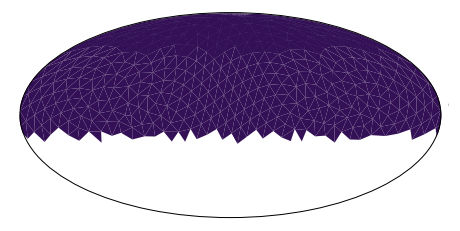

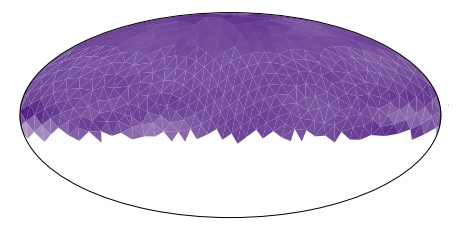

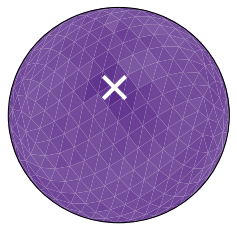

Desert Planet


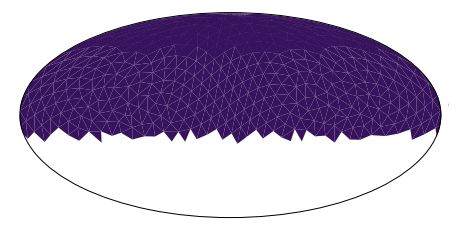

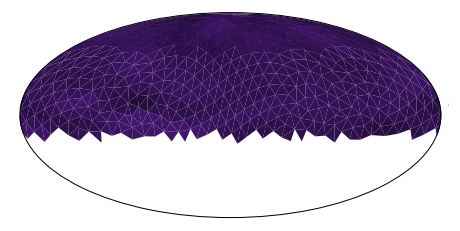

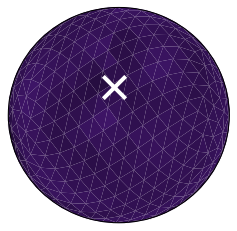

Vegetation Planet


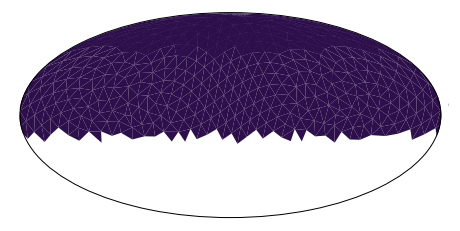

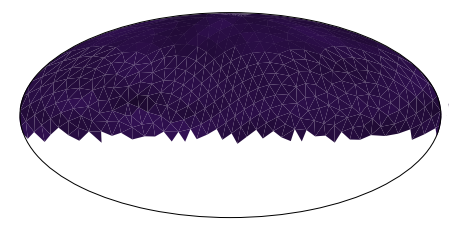

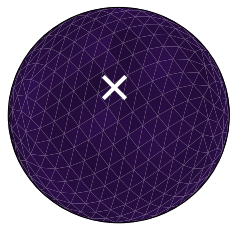

Cloudy Planet


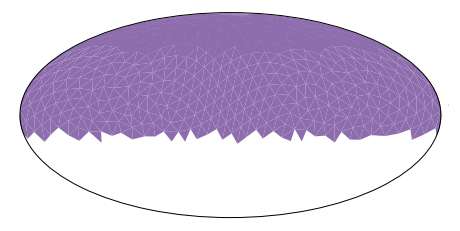

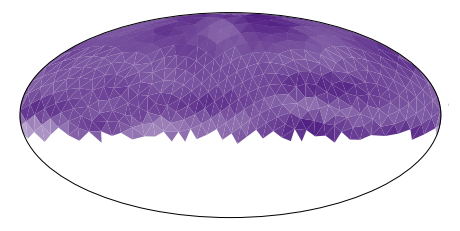

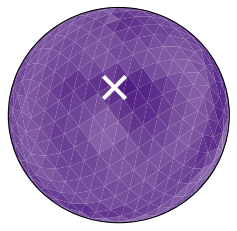

In [ ]:
for incl in [0, 30, 60, 90]:
    print()
    print()
    print(' ---------- incl = ' + str(incl) + ' [deg] ---------- ')

    axes = np.load('data/axes.npy')
    incl_vector = np.array([np.sin(incl * np.pi/180), 0, np.cos(incl * np.pi/180)])
    # mses = np.array([np.mean((np.abs(axis) - np.abs(incl_vector))**2) for axis in axes])
    mses = np.array([np.mean((axis - incl_vector)**2) for axis in axes])
    axis_ind = np.argmin(mses)
    axis = axes[axis_ind]
    num_vis_facets = np.sum(visible_facets(axis_idx = int(axis_ind)))

    print(incl_vector)
    print(axis)

    # build model
    ip = keras.Input(shape = (8,8,1))

    x1 = conv_curves(ip, kernel_size = 3, filters = 1, use_bias = False)
    x2 = Flatten()(x1)
    x3 = Dense(96, input_shape = (96,), use_bias = False)(x2)
    x4 = Dense(num_vis_facets, input_shape = (96,), use_bias = False)(x3)

    y0 = Flatten()(ip)
    y1 = Dense(32, activation = 'relu')(y0)
    y2 = Dense(32, activation = 'relu')(y1)
    y3 = Dense(32, activation = 'relu')(y2)
    y4 = Dense(1)(y3)
    y5 = Dense(1)(y3)

    x5 = Multiply()([x4, y4])
    x6 = Add()([x5, y5])
    model = keras.Model(ip, x6)

    # model = keras.Sequential()
    # model.add(Flatten())
    # model.add(Dense(num_vis_facets, use_bias = 'False'))

    model.compile(optimizer = 'adam', loss='mse')

    for wl_ind, wavelength in zip([0,5], ['800 nm', '400 nm']):
        print()
        print('----- ' + wavelength + ' -----')

        load_data(i = incl, axis_idx = int(axis_ind), norm = True, fourier = False,
                  maps = True, polarization = False, N_max = np.inf)
        maps = albedos[:,wl_ind][stypes.argmax(axis = 2)]

        model.fit(
            curves[:,:,:,wl_ind].reshape(-1,8,8,1),
            maps,
            epochs = 1000,
            batch_size = 32,
            validation_split = 0.1,
            callbacks=[keras.callbacks.EarlyStopping(patience = 10)],
            verbose = 0
        )

        # Now Fourier = True!
        load_data(i = incl, axis_idx = int(axis_ind), norm = True, fourier = True,
                  maps = True, polarization = False, N_max = np.inf)

        fou_pred = model.predict(curves[:,:,:,wl_ind])
        stype_sums = np.sum(stypes, axis = 1)

        for i, stype in enumerate(['Ocean', 'Desert', 'Vegetation', 'Cloudy']):
            print(stype + ' Planet')
            planet = np.argmax(stype_sums[:,i])
            albs = fou_pred[planet]

            # Plot
            faces = np.load('data/faces.npy')
            mollweide(faces[visible_facets(axis_idx = int(axis_ind)).astype('bool')],
                    value_colors(maps[planet], wl = wl_ind,
                                        color_max = 0.999)[1])
            mollweide(faces[visible_facets(axis_idx = int(axis_ind)).astype('bool')],
                    value_colors(albs, wl = wl_ind, color_max = 0.999)[1])

            # Disk from observers perspective
            faces = np.array([[rotate(v, np.cross([0,0,1], axis), angle([0,0,1], axis))\
                  for v in face] for face in faces])
            plot_disk(faces[visible_facets(axis_idx = int(axis_ind)).astype('bool')],
                    value_colors(albs, wl = wl_ind, color_max = 0.999)[1])
            if incl in [0, 30]:
                c = 'black'
            else:
                c = 'white'
            plt.scatter(axis[1], axis[2], s = 500, c = c, marker = 'x', linewidth =4)

            plt.show()

In [ ]:
incl = 0
wl_ind = 5

axes = np.load('data/axes.npy')
incl_vector = np.array([np.sin(incl * np.pi/180), 0, np.cos(incl * np.pi/180)])
mses = np.array([np.mean((np.abs(axis) - np.abs(incl_vector))**2) for axis in axes])
axis_ind = np.argmin(mses)
axis = axes[axis_ind]
num_vis_facets = np.sum(visible_facets(axis_idx = int(axis_ind)))

model = keras.Sequential()
model.add(Flatten())
model.add(Dense(num_vis_facets, use_bias = False))
model.compile(optimizer = 'adam', loss='mse')

load_data(i = incl, axis_idx = int(axis_ind), norm = False, fourier = False,
            maps = True, polarization = False, N_max = np.inf)
maps = albedos[:,wl_ind][stypes.argmax(axis = 2)]

model.fit(
    curves[:,:,:,wl_ind].reshape(-1,8,8,1),
    maps,
    epochs = 1000,
    batch_size = 32,
    validation_split = 0.1,
    callbacks=[keras.callbacks.EarlyStopping(patience = 10)],
    verbose = 1
)

for layer in model.layers:
    weights = layer.get_weights()

curves:  (8922, 8, 8, 6)
combos:  (8922, 4)
axes:    (8922, 3)
stypes:  (8922, 986, 4)
Epoch 1/1000
251/251 [==============================] - 1s 2ms/step - loss: 0.0638 - val_loss: 0.0168
Epoch 2/1000
251/251 [==============================] - 0s 2ms/step - loss: 0.0164 - val_loss: 0.0167
Epoch 3/1000
251/251 [==============================] - 0s 2ms/step - loss: 0.0165 - val_loss: 0.0166
Epoch 4/1000
251/251 [==============================] - 1s 2ms/step - loss: 0.0163 - val_loss: 0.0165
Epoch 5/1000
251/251 [==============================] - 0s 2ms/step - loss: 0.0161 - val_loss: 0.0164
Epoch 6/1000
251/251 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0164
Epoch 7/1000
251/251 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.0162
Epoch 8/1000
251/251 [==============================] - 0s 2ms/step - loss: 0.0158 - val_loss: 0.0162
Epoch 9/1000
251/251 [==============================] - 0s 2ms/step - loss: 0.0160 - val_loss: 0.

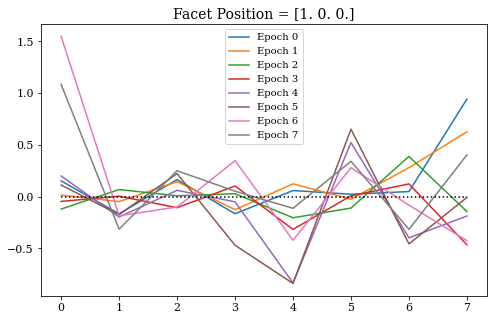

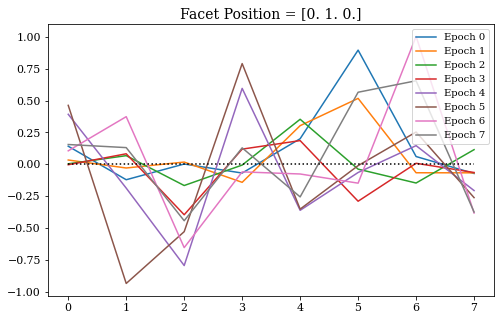

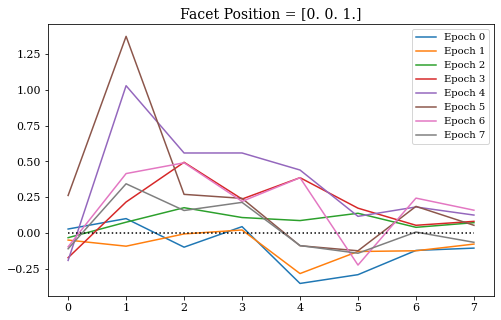

In [ ]:
faces = np.load('data/faces.npy')
faces = faces[visible_facets(axis_idx = int(axis_ind)).astype('bool')]
points = np.mean(faces, axis = 1)

for v in np.identity(3):
    mses = np.array([np.mean((point - v)**2) for point in points])
    point_ind = np.argmin(mses)
    curves = weights[0][:,point_ind].reshape(8,8)

    plt.figure(figsize = (8,5))
    for i, curve in enumerate(curves):
        plt.plot(curve, label = 'Epoch ' + str(i))
    plt.legend()
    plt.title('Facet Position = ' + str(v))
    plt.plot([0,7], [0,0], color = 'black', linestyle = 'dotted')
    plt.show()
    # print(curves)

# Different Inclinations and Axes

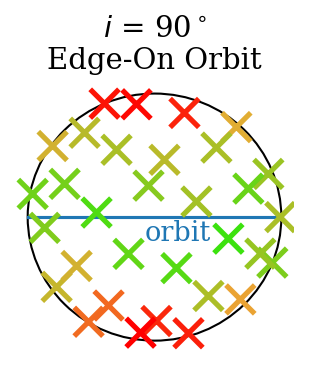

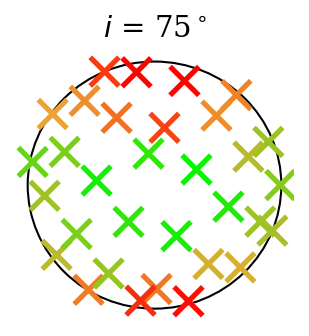

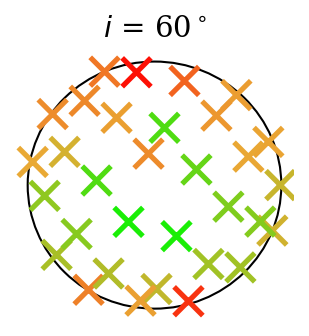

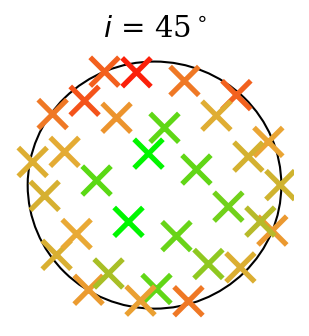

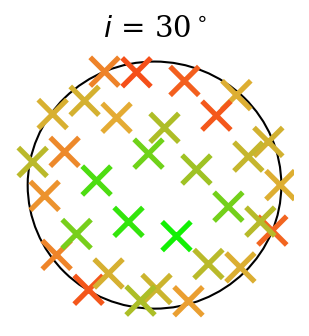

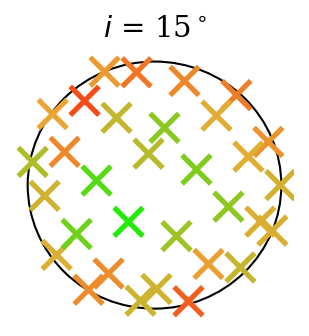

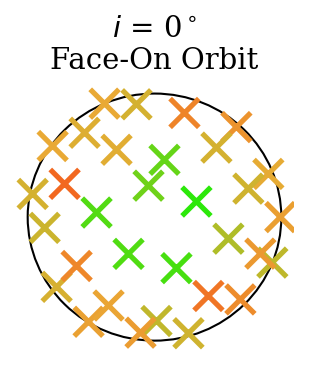

In [ ]:
losses = np.load('three_layers_losses.npy')

axes = np.load('data/axes.npy')
axes_x = np.array([axis for axis in axes if axis[0] >= 0])

losses -= np.min(losses)
losses /= np.max(losses)

# inclinations = [0,15,30,45,60,75,90]
inclinations = [90,75,60,45,30,15,0]

for row, i  in zip(losses, inclinations):

    cmap = LinearSegmentedColormap.from_list('mycmap',
                                             ['#00f600', '#e9aa35', 'red'])
    color = cmap(row)
    # color = [[c,c,c] for c in row]

    fig, ax = plt.subplots(figsize = (2.4,2.4),dpi = 150)
    c = plt.Circle((0,0),1, fill = False, linewidth = 1)

    ax.add_patch(c)
    fig.set_facecolor('white')
    plt.scatter(axes_x[:,1], axes_x[:,2], marker='x',
                linewidth = 2.5, color = color, zorder = 3, s = 190)

    title = '$i$ = ' + str(i) + '$^\circ$'
    if i == 90:
        title += '\nEdge-On Orbit'
        plt.plot([-1,1], [0,0], color = 'tab:blue')
        plt.text(-0.08, -0.19, 'orbit', size = 13, color = 'tab:blue')
    elif i == 0:
        title += '\nFace-On Orbit'
    plt.title(title)
    plt.axis('off')
    plt.xlabel('y')
    plt.ylabel('z')